## Reading PDF files to review our Documents Type

In [16]:
import os
path = r"/home/developer/Dev/Machine-Learning-Projects/Ai_Document_Extractor/test/EmployeesData"
os.listdir(path)

['Contracts',
 'output_images',
 'tenancy.pdf',
 'Passport',
 'Change Status',
 'رسوم عقد عمل.pdf',
 'DUBAI INSURANCE COMPANY.pdf',
 'eVisa',
 'رسوم زيارة ثانية.pdf',
 'New Work Entry Permit - Employee',
 'رسوم تاشيرة عمل.pdf',
 'Residence',
 'رسوم تعديل وضع.pdf']

In [17]:
# Internal folder name
typeFolder = "Contracts"

# Map internal folder names to human-readable names
Folder_Names = {
    "Change Status": "Change_of_Status_Documents",
    "Residence": "Residence_Documents",
    "eVisa Tourism": "Tourism_Visa_Documents",
    "eVisa Employment": "Employment_Visa_Documents",
    "Employment Contract Full Work": "Full_Employment_Contracts",
    "Passport": "Passport_Documents"
}

In [18]:
import os
import fitz  # PyMuPDF

folder_name = Folder_Names.get(typeFolder, typeFolder)

# Full folder path
folder_path = os.path.join(path, typeFolder)

## Tenancy file

In [19]:
tenancy_file_path = r"/home/developer/Dev/Machine-Learning-Projects/Ai_Document_Extractor/test/EmployeesData"

In [20]:
# This is a list comprehension in Python. It creates a list of .pdf files found in the folder folder_path.
files = [f for f in os.listdir(tenancy_file_path) if f.lower().endswith(".pdf")]
print(files)

['tenancy.pdf', 'رسوم عقد عمل.pdf', 'DUBAI INSURANCE COMPANY.pdf', 'رسوم زيارة ثانية.pdf', 'رسوم تاشيرة عمل.pdf', 'رسوم تعديل وضع.pdf']


In [11]:
# This is a list comprehension in Python. It creates a list of .pdf files found in the folder folder_path.
files = [f for f in os.listdir(folder_path) if f.lower().endswith('.pdf')]
print(files)

NameError: name 'folder_path' is not defined

In [21]:
# This is a list comprehension in Python. It creates a list of .pdf files found in the folder folder_path.
files = [f for f in os.listdir(tenancy_file_path) if f.lower().endswith(".pdf")]

# Open PDF file ( Indices relate to files number in the above list)
if files:
    pdf_path = os.path.join(tenancy_file_path, files[0])
    doc = fitz.open(pdf_path)
    text= doc[0].get_text()
    print(f"Reading from: {tenancy_file_path}")
    print(text)
else:
    print(f"No PDF files found in: {tenancy_file_path}")

Reading from: /home/developer/Dev/Machine-Learning-Projects/Ai_Document_Extractor/test/EmployeesData



Convert PDF to Image and then use OCR to extract text from the image.


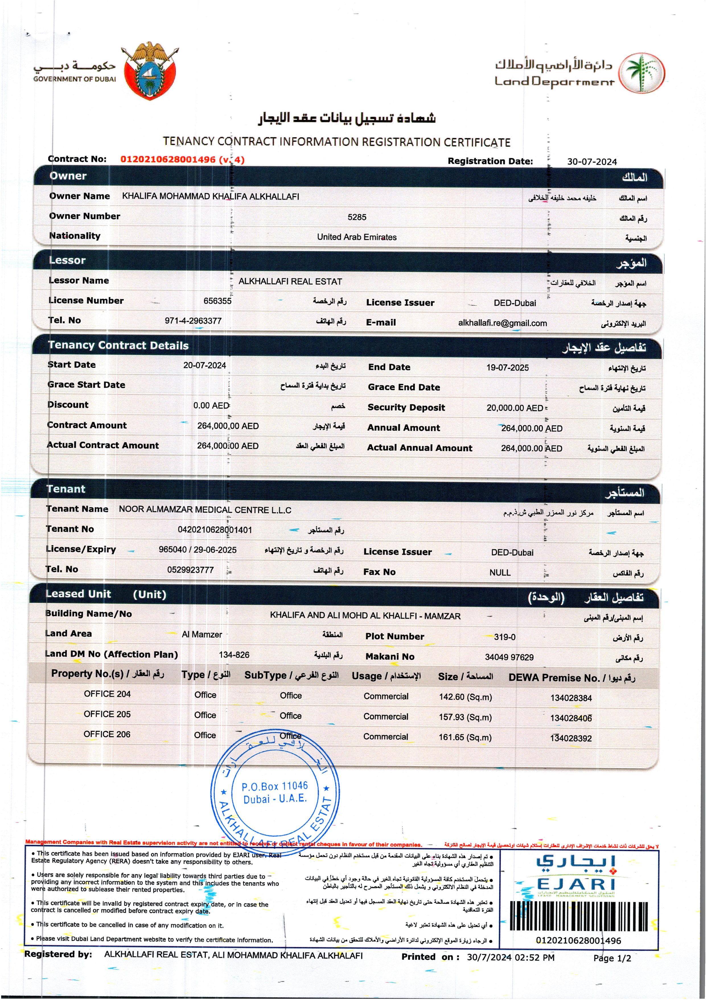

In [22]:
from PIL import Image
import io

import fitz  # PyMuPDF

# Convert each page of the PDF to an image and save/display
pdf_doc = fitz.open(pdf_path)
images = []
for i, page in enumerate(pdf_doc):
    pix = page.get_pixmap(dpi=300)
    img = Image.open(io.BytesIO(pix.tobytes("png"))).convert("RGB")
    images.append(img)
    # Optionally save the image
    img.save(f"page_{i+1}.png")
    # Optionally display the image in notebook
    display(img)
    break

##  Large Language Models (LLMs)

#### 1. QWEN OCR:
- Multilingual Support:
- Trained on large-scale data that includes Chinese, English, and other languages.
- Strong performance on mixed-language content (e.g., Chinese-English text).
- QWEN OCR is a proprietary model focused on text extraction.
- QWEN OCR is specifically designed for extracting text from images of documents, tables, and payslips.
- Qwen2-VL-2B-OCR is a fine-tuned variant of unsloth/Qwen2-VL-2B-Instruct, optimized specifically for Optical Character Recognition (OCR).

In [23]:
from transformers import AutoProcessor, AutoModelForImageTextToText
import requests
import torch
# Define the size dictionary with the required keys
# These values are based on the error message's suggested default if size is None
# You might need to adjust these based on the specific model documentation if available
processor_kwargs = {
    "size": {"shortest_edge": 56 * 56, "longest_edge": 28 * 28 * 1280}
}

# Load model from local path
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_path = r"/home/developer/Dev/Qwen2-VL-2B-OCR"

processor = AutoProcessor.from_pretrained(model_path, **processor_kwargs)

# model = AutoModelForImageTextToText.from_pretrained(model_path, torch_dtype=torch.float16, device_map="auto") # auto device placement, offloading to CPU if needed
model = AutoModelForImageTextToText.from_pretrained(model_path, torch_dtype=torch.float16) # Move model to the specified device (GPU or CPU)

/home/developer/Dev/Machine-Learning-Projects/Ai_Document_Extractor/venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.
You have video processor config saved in `preprocessor.json` file which is deprecated. Video processor configs should be saved in their own `video_preprocessor.json` file. You can rename the file or load and save the processor back which renames it automatically. Loading from `preprocessor.json` will be removed in v5.0.


In [24]:
import requests
import torch
import time
from torchvision import io
from typing import Dict

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move model to the right device
model = model.to(device)
conversation = [
    {
        "role": "user",
        "content": [
            {
                "type": "image",
            },
            {
                "type": "text",
                "text": (
                    "Extract all the data from the image, headlines and don't miss any"
                ),
            },
        ],
    }
]


# Preprocess the inputs
text_prompt = processor.apply_chat_template(conversation, add_generation_prompt=True)
# Excepted output: '<|im_start|>system\nYou are a helpful assistant.<|im_end|>\n<|im_start|>user\n<|vision_start|><|image_pad|><|vision_end|>Describe this image.<|im_end|>\n<|im_start|>assistant\n'

inputs = processor(text=[text_prompt], images=[img], padding=True, return_tensors="pt")
# inputs = inputs.to('cuda')
# Move input tensors to the same device
inputs = {k: v.to(device) if isinstance(v, torch.Tensor) else v for k, v in inputs.items()}


start = time.time() 
# Inference: Generation of the output
output_ids = model.generate(**inputs, max_new_tokens=2048)
# generated_ids = [output_ids[len(input_ids):] for input_ids, output_ids in zip(inputs.input_ids, output_ids)]
generated_ids = [output_ids[len(input_ids):] for input_ids, output_ids in zip(inputs["input_ids"], output_ids)]

output_text = processor.batch_decode(generated_ids, skip_special_tokens=True, clean_up_tokenization_spaces=True)
elapsed = time.time() - start
print(f"Inference time: {elapsed:.2f} sec")

Inference time: 42.41 sec


In [25]:
print(output_text[0])

### Shipment Registration Certificate
#### Tenancy Contract Information
#### Registration Date: 30-07-2024
#### Contract No: 0120210628001496 (v.4)
#### Owner Name: Khalifa Mohammad Khalifa Alkhalafi
#### Owner Number: 5285
#### Nationality: United Arab Emirates
#### Lessor Name: Alkhalafi Real Estate
#### Lessor Number: 656355
#### License Number: null
#### License Issuer: DED-Dubai
#### Tel No: 971-4-2963377
#### E-mail: alkhalafi.re@gmail.com
#### Tenancy Contract Details
- **Start Date:** 20-07-2024
- **End Date:** 19-07-2025
- **Discount:** 0.00 AED
- **Security Deposit:** 20,000.00 AED
- **Contract Amount:** 264,000.00 AED
- **Annual Amount:** 264,000.00 AED
- **Plot Area:** null
- **Tenancy Agreement Details**
  - **Tenancy Agreement Details**
  - **Tenancy Agreement Details**
  - **Tenancy Agreement Details**
  - **Tenancy Agreement Details**
  - **Tenancy Agreement Details**
  - **Tenancy Agreement Details**
  - **Tenancy Agreement Details**
  - **Tenancy Agreement Details**
 

In [80]:
torch.cuda.empty_cache()
torch.cuda.ipc_collect()

### Estimating VRAM for Qwen2-VL-2B-OCR

In [81]:
def estimate_vram_qwen2_vl(batch_size: int = 10,
                            image_resolution: int = 1024,  # pixels, assume square (or min edge)
                            max_tokens: int = 2048,
                            precision: str = 'fp16') -> float:
    """
    Estimate VRAM required to run Qwen2-VL-2B-OCR based on inputs.

    Returns: VRAM in GB
    """
    # Assume vision encoder adds ~1.2 GB @384px in fp16 per image
    # Model weights (2B params): 2e9 * 2 bytes (fp16) ≈ 4GB
    # Activation memory & decoder usage scales with batch and token count

    precision = precision.lower()
    if precision == 'fp32':
        factor = 4
    elif precision == 'fp16':
        factor = 2
    elif precision == 'int8':
        factor = 1
    else:
        raise ValueError("Unsupported precision")

    model_weight_memory = 2e9 * factor / (1024 ** 3)  # GB

    vision_encoder_memory = batch_size * (1.2 if image_resolution >= 1024 else 0.8)  # GB

    decoder_memory = batch_size * max_tokens * factor * 2 / (1024 ** 2)  # MB → GB
    decoder_memory /= 1024

    overhead_memory = 1.0  # buffers, CUDA, attention cache

    total_vram = model_weight_memory + vision_encoder_memory + decoder_memory + overhead_memory
    return round(total_vram, 2)


In [82]:
vram = estimate_vram_qwen2_vl(batch_size=10, image_resolution=1024, max_tokens=2048, precision='fp16')
print(f"Estimated VRAM needed: {vram} GB")


Estimated VRAM needed: 16.73 GB


**Parameters:**

- batch_size: Number of images/texts processed at once.
- image_resolution: Shortest image edge size in pixels (e.g., 384).
- max_tokens: Number of tokens generated or used during decoding.
- precision: Numeric precision mode (fp16, fp32, or int8).

In [83]:
# Import the os module for operating system functionalities
import os 
# Import load_dotenv function from python-dotenv package
from dotenv import load_dotenv
# Load environment variables from a .env file into the environment
load_dotenv()

True

## ChatGroq with LangChain:
- ChatGroq with LangChain enables structured, large language model (LLM) interactions using Groq's API.
 

In [84]:
# Import the ChatGroq class from langchain_groq library for interacting with Groq's API
import os
import fitz  # PyMuPDF
from dotenv import load_dotenv
from langchain_groq import ChatGroq
from langchain_core.prompts import ChatPromptTemplate
from pydantic import BaseModel, Field
from typing import Optional
from langchain_core.runnables import Runnable

# Initialize a ChatGroq instance with the following parameters:
# - model: Using the "deepseek-r1-distill-llama-70b" model
# - temperature: Set to 0.7 (higher values make output more random/creative)
# - max_tokens: Limit the response to 1024 tokens maximum
llm = ChatGroq(
    model="deepseek-r1-distill-llama-70b",
    temperature=0.0,
    max_tokens=1024,
)

In [85]:
from pydantic import BaseModel, Field, ValidationError
from typing import Optional, Union, List, Literal
from enum import Enum


class PersonalInfo(str, Enum):
    CONTRACT = "EMPLOYMENT CONTRACT FULL WORK"
    TOURISM_VISA = "eVisa - Tourism"
    EMPLOYMENT_VISA = "eVisa - Employment"
    RESIDENCE = "Residence"
    CHANGE_STATUS = "Change Status"
    HEALTHCARE = "Healthcare Professional Registration Certificate"
    PASSPORT = "Passport"


class ContractData(BaseModel):
    document_type: Literal["EMPLOYMENT CONTRACT FULL WORK"] = Field(
        ..., description="Must be: EMPLOYMENT CONTRACT FULL WORK"
    )
    work_style: Union[str, None] = Field(
        None, description="Type of work (e.g., Full time, Part time, Temporary)"
    )
    transaction_number: Union[str, None] = Field(
        None, description="Transaction number listed on the contract"
    )
    name: Union[str, None] = Field(None, description="Full legal name of the employee")
    nationality: Union[str, None] = Field(
        None, description="Nationality of the employee"
    )
    passport_number: Union[str, None] = Field(None, description="Passport number")
    date_of_birth: Union[str, None] = Field(
        None, description="Date of birth in format YYYY-MM-DD or as found"
    )
    academic_qualification: Union[str, None] = Field(
        None, description="Academic qualification (e.g., Bachelor, Master)"
    )
    contract_start: Union[str, None] = Field(
        None, description="Start date of the contract (Article 2)"
    )
    contract_end: Union[str, None] = Field(
        None, description="End date of the contract (Article 2)"
    )


class VisaData(BaseModel):
    document_type: Literal["eVisa - Tourism", "eVisa - Employment"] = Field(
        ..., description="Must be: eVisa - Tourism or eVisa - Employment"
    )
    issue_date: Union[str, None] = Field(
        None, description="Date when the visa was issued"
    )
    place_of_issue: Union[str, None] = Field(
        None, description="Place (city or country) where the visa was issued"
    )
    valid_until: Union[str, None] = Field(
        None, description="Expiration date of the visa"
    )
    uid_number: Union[str, None] = Field(
        None, description="UID (Unified ID), a 9 to 15 digit number"
    )
    full_name: Union[str, None] = Field(
        None, description="Full name of the visa holder (may appear on two lines)"
    )
    nationality: Union[str, None] = Field(
        None, description="Nationality of the visa holder"
    )
    place_of_birth: Union[str, None] = Field(None, description="Place of birth")
    date_of_birth: Union[str, None] = Field(None, description="Date of birth")
    passport_number: Union[str, None] = Field(None, description="Passport number")
    passport_type: Union[str, None] = Field(
        None, description="Type of passport (e.g., Ordinary, Diplomatic)"
    )
    profession: Union[str, None] = Field(
        None, description="Profession or job title listed on the visa"
    )


class ResidenceData(BaseModel):
    document_type: Literal["Residence"] = Field(..., description="Must be: Residence")
    id_number: Union[str, None] = Field(
        None, description="ID number, may contain Arabic characters"
    )
    passport_number: Union[str, None] = Field(None, description="Passport number")
    name: Union[str, None] = Field(None, description="Full name of the individual")
    profession: Union[str, None] = Field(
        None, description="Listed profession or occupation"
    )
    issue_date: Union[str, None] = Field(
        None, description="Date when the residence was issued"
    )
    expiry_date: Union[str, None] = Field(
        None, description="Expiration date of the residence"
    )


class ChangeStatusData(BaseModel):
    document_type: Literal["Change Status"] = Field(
        ..., description="Must be: Change Status"
    )
    uid_number: Union[str, None] = Field(
        None, description="UID (Unified Identification Number)"
    )
    name: Union[str, None] = Field(None, description="Full name of the person")
    nationality: Union[str, None] = Field(None, description="Nationality")
    profession: Union[str, None] = Field(None, description="Stated profession")
    passport_number: Union[str, None] = Field(None, description="Passport number")
    employer_name: Union[str, None] = Field(None, description="Name of the employer")
    residence_stamping_deadline: Union[str, None] = Field(
        None, description="Deadline for residence stamping"
    )


class HealthcareRegistrationData(BaseModel):
    document_type: Literal["Healthcare Professional Regestration Certificate"] = Field(
        ..., description="Must be: Healthcare Professional Regestration Certificate"
    )
    professional_name: Union[str, None] = Field(
        None, description="Name of the healthcare professional"
    )
    dha_unique_id: Union[str, None] = Field(None, description="DHA Unique Identifier")


class PassportData(BaseModel):
    document_type: Literal["Passport"] = Field(..., description="Must be: Passport")
    passport_number: Union[str, None] = Field(None, description="Passport number")
    name: Union[str, None] = Field(None, description="Full name as shown on passport")
    date_of_birth: Union[str, None] = Field(None, description="Date of birth")
    date_of_issue: Union[str, None] = Field(None, description="Issue date of passport")
    date_of_expiry: Union[str, None] = Field(
        None, description="Expiration date of passport"
    )
    profession: Union[str, None] = Field(
        None, description="Profession listed in the passport"
    )


class DocumentSchema(BaseModel):
    document_type: PersonalInfo
    contract_details: Optional[List[ContractData]] = None
    visa_details: Optional[List[VisaData]] = None
    residence_details: Optional[List[ResidenceData]] = None
    changeStatus_details: Optional[List[ChangeStatusData]] = None
    healthcare_details: Optional[List[HealthcareRegistrationData]] = None
    passport_details: Optional[List[PassportData]] = None

In [86]:
structured_llm = llm.with_structured_output(DocumentSchema)

schema_template = """
Your task is to extract all structured data from the provided document.
The document type could be one of the following:
- EMPLOYMENT CONTRACT FULL WORK
- eVisa - Tourism
- eVisa - Employment
- Residence
- Change Status
- Passport
- Healthcare Professional Registration Certificate

Here is the document text:

{extractedData}

Extract the data according to the corresponding fields and return the structured JSON schema.
Start!
"""


In [87]:
schema_prompt = ChatPromptTemplate.from_template(schema_template)
schema_chain = schema_prompt | structured_llm

In [88]:
q = schema_chain.invoke({"extractedData": output_text})
q

DocumentSchema(document_type=<PersonalInfo.CONTRACT: 'EMPLOYMENT CONTRACT FULL WORK'>, contract_details=[ContractData(document_type='EMPLOYMENT CONTRACT FULL WORK', work_style='Full time', transaction_number='MB291046226AE', name='MARWAN F M ZENATY', nationality='PALESTINE', passport_number='N5067782', date_of_birth='10/10/1998', academic_qualification='Diploma', contract_start='21/05/2025', contract_end='21/05/2027')], visa_details=None, residence_details=None, changeStatus_details=None, healthcare_details=None, passport_details=None)

In [89]:
q.model_dump_json()

'{"document_type":"EMPLOYMENT CONTRACT FULL WORK","contract_details":[{"document_type":"EMPLOYMENT CONTRACT FULL WORK","work_style":"Full time","transaction_number":"MB291046226AE","name":"MARWAN F M ZENATY","nationality":"PALESTINE","passport_number":"N5067782","date_of_birth":"10/10/1998","academic_qualification":"Diploma","contract_start":"21/05/2025","contract_end":"21/05/2027"}],"visa_details":null,"residence_details":null,"changeStatus_details":null,"healthcare_details":null,"passport_details":null}'

In [90]:
q.model_dump_json()

import json
parsed = json.loads(q.model_dump_json())
pretty_output = json.dumps(parsed, indent=4)
print(pretty_output)

{
    "document_type": "EMPLOYMENT CONTRACT FULL WORK",
    "contract_details": [
        {
            "document_type": "EMPLOYMENT CONTRACT FULL WORK",
            "work_style": "Full time",
            "transaction_number": "MB291046226AE",
            "name": "MARWAN F M ZENATY",
            "nationality": "PALESTINE",
            "passport_number": "N5067782",
            "date_of_birth": "10/10/1998",
            "academic_qualification": "Diploma",
            "contract_start": "21/05/2025",
            "contract_end": "21/05/2027"
        }
    ],
    "visa_details": null,
    "residence_details": null,
    "changeStatus_details": null,
    "healthcare_details": null,
    "passport_details": null
}


In [91]:
import json


def extract_clean_output(q):
    """
    Given a Pydantic model output (q), extract document_type and only the relevant non-null details.
    """
    data = json.loads(q.model_dump_json())
    doc_type = data.get("document_type")

    # Mapping document_type to its corresponding field name in the schema
    doc_type_field_map = {
        "EMPLOYMENT CONTRACT FULL WORK": "contract_details",
        "eVisa - Tourism": "visa_details",
        "eVisa - Employment": "visa_details",
        "Residence": "residence_details",
        "Change Status": "changeStatus_details",
        "Passport": "passport_details",
        "Healthcare Professional Registration Certificate": "healthcare_details",
    }

    # Lookup the relevant section based on doc_type
    relevant_key = doc_type_field_map.get(doc_type)

    if not relevant_key:
        return json.dumps(
            {
                "document_type": doc_type,
                "message": "Unsupported or unknown document type.",
            },
            indent=4,
        )

    relevant_data = data.get(relevant_key)

    if not relevant_data:
        return json.dumps(
            {"document_type": doc_type, "message": f"No data found for {relevant_key}"},
            indent=4,
        )

    # Return the filtered output
    result = {"document_type": doc_type, relevant_key: relevant_data}

    return json.dumps(result, indent=4)

In [92]:
print(extract_clean_output(q))

{
    "document_type": "EMPLOYMENT CONTRACT FULL WORK",
    "contract_details": [
        {
            "document_type": "EMPLOYMENT CONTRACT FULL WORK",
            "work_style": "Full time",
            "transaction_number": "MB291046226AE",
            "name": "MARWAN F M ZENATY",
            "nationality": "PALESTINE",
            "passport_number": "N5067782",
            "date_of_birth": "10/10/1998",
            "academic_qualification": "Diploma",
            "contract_start": "21/05/2025",
            "contract_end": "21/05/2027"
        }
    ]
}
